In [ ]:
%run /work/jupyter_notebooks/gene\ family\ distances/correlate_evolution.ipynb

In [1]:
%run correlate_evolution.ipynb

%cd /work/clusterEvo/new_tests/eggNOG/duplications/

/work/clusterEvo/new_tests/eggNOG/duplications


In [2]:
import pandas as pd
import igraph as ig
from collections import Counter
import random
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np
import colorlover as cl
import time
import requests
import itertools
from scipy.spatial.distance import braycurtis
import ete3
import multiprocessing
from IPython.display import display, clear_output
from scipy.stats import mannwhitneyu
import matplotlib as mpl

ncbi = ete3.NCBITaxa()

In [3]:
duplicated_genes = pd.read_csv('duplicated_genes.tsv', sep='\t', index_col=0)

duplicated_genes.taxa    = duplicated_genes.taxa.map(   lambda cell: set(cell.strip('[]').split(', ')))
duplicated_genes.members = duplicated_genes.members.map(lambda cell: set(cell.split(',')))
duplicated_genes.set_index('group_id', inplace=True)
duplicated_genes.head()

,num_proteins,num_taxa,members,taxa
group_id,,,,
arCOG00001,153,74,"{273063.STK_07720, 263820.PTO1388, 272844.PAB0...","{224719, 647113, 985053, 591019, 1104324, 2469..."
arCOG00002,188,116,"{195522.BD01_0489, 1210908.HSB1_36360, 751944....","{591019, 572546, 877455, 1343739, 797304, 1227..."
arCOG00006,96,61,"{272569.rrnAC3322, 795797.C497_07079, 29540.C4...","{413816, 1230457, 222984, 358396, 406552, 7957..."
arCOG00014,441,167,"{1151117.AJLF01000002_gene281, 362976.HQ_1455A...","{591019, 572546, 877455, 1343739, 797304, 3398..."
arCOG00016,62,62,"{1151117.AJLF01000001_gene898, 933801.Ahos_087...","{224719, 985053, 330779, 591019, 1104324, 2469..."


In [ ]:
eggNOG_trees = pd.read_csv('../2157_trees.tsv',
                           sep      ='\t',
                           header   =None,
                           usecols  =[1,2,3],
                           index_col=0,
                           names    =['group_id', 'fast', 'tree'])

In [4]:
rsquared = pd.read_parquet('Rsquared_duplicated_genes.parquet', engine='fastparquet')
rsquared['group_pair'] = rsquared[['group1', 'group2']].agg(frozenset, axis=1)
rsquared.set_index('group_pair', inplace=True)

rsquared.head()

In [6]:
braycurtis = pd.read_parquet('braycurtis_duplicated_genes.parquet', engine='fastparquet')
braycurtis['group_pair'] = braycurtis[['group1', 'group2']].agg(frozenset, axis=1)
braycurtis.set_index('group_pair', inplace=True)

braycurtis.head()

,group1,group2,braycurtis
group_pair,,,
"(arCOG00002, arCOG00001)",arCOG00001,arCOG00002,0.539589
"(arCOG00006, arCOG00001)",arCOG00001,arCOG00006,0.016064
"(arCOG00001, arCOG00014)",arCOG00001,arCOG00014,0.404040
"(arCOG00016, arCOG00001)",arCOG00001,arCOG00016,0.493023
"(arCOG00017, arCOG00001)",arCOG00001,arCOG00017,0.534884


In [7]:
coevol_df           = rsquared.join(braycurtis.braycurtis)
coevol_df['coevol'] = coevol_df.Rsquared * coevol_df.braycurtis
coevol_df.head()

,group1,group2,Rsquared,braycurtis,coevol
group_pair,,,,,
"(arCOG00002, arCOG00001)",arCOG00001,arCOG00002,0.593271,0.539589,0.320123
"(arCOG00006, arCOG00001)",arCOG00001,arCOG00006,NaN,0.016064,NaN
"(arCOG00001, arCOG00014)",arCOG00001,arCOG00014,0.630685,0.404040,0.254822
"(arCOG00016, arCOG00001)",arCOG00001,arCOG00016,0.836091,0.493023,0.412213
"(arCOG00017, arCOG00001)",arCOG00001,arCOG00017,0.670219,0.534884,0.358489


In [8]:
coevol_df.query('coevol >= 0.7').shape

(99121, 5)

In [10]:
graph = ig.Graph.TupleList(edges=coevol_df.query('coevol >= 0.7')[['group1', 
                                                                   'group2', 
                                                                   'coevol']].itertuples(index=False, name=None), 
                           directed=False, 
                           weights=True)

random.seed(12345)
clusters = graph.community_multilevel(weights='weight')

graph_layout = graph.layout(layout='auto')
coords = np.array(graph_layout.coords)

graph.vs['cluster' ] = clusters.membership
graph.vs['coords'  ] = graph_layout.coords
graph.vs['num_taxa'] = duplicated_genes.loc[graph.vs['name'], 'num_taxa'].tolist()

In [11]:
opacity = 0.7
minimum_size_clusters = [clst_num 
                         for clst_num, count in Counter(clusters.membership).items() 
                         if count >= 50]
cluster_colors = {clst_num:tmp_color.replace(')', f',{opacity})') 
                  for clst_num, tmp_color in zip(minimum_size_clusters,
                                                 cl.scales[str(len(minimum_size_clusters))]['qual']['Set3'])}
colors = []
for clst_num in clusters.membership:
    if clst_num not in cluster_colors:
        colors.append(f'rgb(0,0,0,{opacity})')
    else:
        colors.append(cluster_colors[clst_num])

In [ ]:
ig.plot(graph, 
        layout=graph_layout,
        vertex_color=colors, 
        edge_color='rgb(0,0,0,0.3)', 
        vertex_size=0.1 * np.array(graph.vs['num_taxa']), 
        bbox=(800, 600)
)

In [12]:
clusters = {}
for clst_num in minimum_size_clusters:
    clusters[clst_num] = graph.vs.select(cluster=clst_num)

In [ ]:
# for clst_num, groups in clusters.items():
#     print(clst_num)
#     for group_name in groups['name']:
#         tmp_aln = requests.get(f'http://eggnogapi5.embl.de/nog_data/text/raw_alg/{group_name}').text
#         with open(f'../alignments/{group_name}.aln', 'w') as out:
#             out.write(tmp_aln)
#         time.sleep(3)

In [ ]:
hex_colors = []
for clst_num in minimum_size_clusters:
    rgb_code = tuple(int(tmp) for tmp in cl.to_numeric([cluster_colors[clst_num].replace(',0.7)', ')')])[0])
    print(clst_num, len(clusters[clst_num]))
    hex_colors.append('#%02x%02x%02x' % rgb_code)
sns.palplot(hex_colors)

In [ ]:
fig, axs = plt.subplots(nrows=len(minimum_size_clusters), sharex=True)

for clst_num, ax, color in zip(minimum_size_clusters, axs, hex_colors):
    sns.kdeplot(clusters[clst_num]['num_taxa'], color=color, shade=True, ax=ax)

In [ ]:
cluster0_df = duplicated_genes.loc[clusters[0]['name']]

In [ ]:
cluster0_df.mean()

In [13]:
representatives = duplicated_genes.query('num_taxa     == 168 & '
                                         'num_proteins == 168').iloc[0,3]

In [14]:
taxon_occurrences = pd.DataFrame(columns=representatives)
for clst_num in minimum_size_clusters:
    group_names = clusters[clst_num]['name']
    taxa_concat = list(itertools.chain(*duplicated_genes.loc[group_names, 'taxa'].tolist()))
    taxon_freq  = pd.Series(Counter(taxa_concat)) / len(group_names)
    taxon_freq.name = f'cluster_{clst_num}'
    
    taxon_occurrences = taxon_occurrences.append(taxon_freq)
    
taxon_occurrences[taxon_occurrences.isna()] = 0

In [15]:
taxon_occurrences

,591019,572546,877455,1343739,797304,339860,573063,1227488,195522,679926,...,444158,797302,543526,1210908,444157,1006006,426368,662479,456320,1238425
cluster_0,0.039506,0.103704,0.071605,0.066667,0.955556,0.039506,0.007407,0.987654,0.046914,0.155556,...,0.032099,0.891358,0.985185,0.980247,0.034568,0.064198,0.032099,0.967901,0.029630,0.841975
cluster_1,0.853333,0.706667,0.586667,0.933333,0.080000,0.520000,0.720000,0.013333,0.946667,0.440000,...,0.706667,0.013333,0.013333,0.026667,0.866667,0.653333,0.693333,0.026667,0.640000,0.066667
cluster_2,0.705009,0.886827,0.881262,0.834879,0.996289,0.825603,0.877551,0.988868,0.820037,0.894249,...,0.886827,0.936920,0.990724,0.962894,0.846011,0.825603,0.894249,0.985158,0.868275,0.916512


In [478]:
len(clusters[0])

405

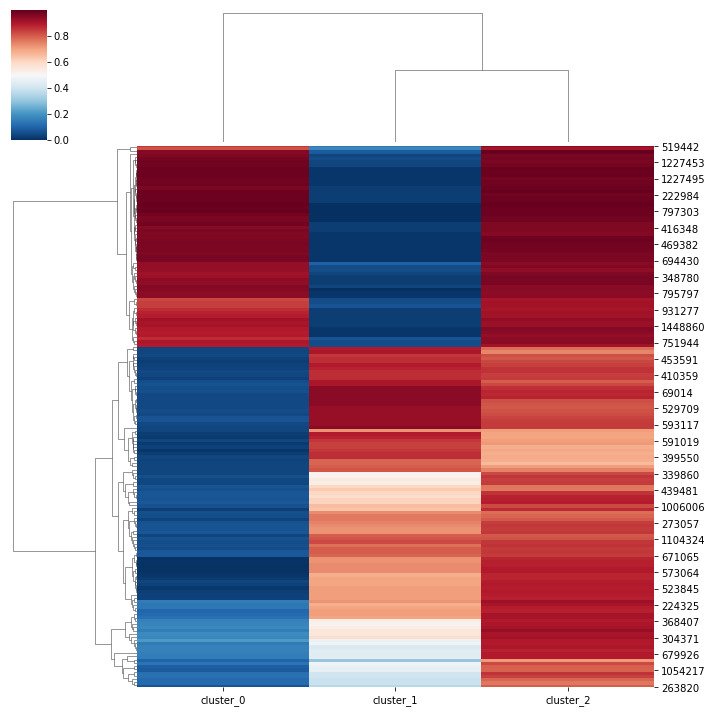

In [16]:
sns.clustermap(taxon_occurrences.T, metric='braycurtis', cmap='RdBu_r');

In [17]:
eggNOG_trees = pd.read_csv('../2157_trees.tsv',
                           sep      ='\t',
                           header   =None,
                           usecols  =[1,2,3],
                           index_col=0,
                           names    =['group_id', 'fast', 'tree'])
eggNOG_trees = eggNOG_trees.reindex(index=duplicated_genes.index)

group_ids = []
trees     = []
for index, row in eggNOG_trees.loc[clusters[2]['name']].iterrows():
    group_ids.append(index)
    trees.append(ete3.Tree(row.tree))

pool          = multiprocessing.Pool(processes = 10)
dist_matrices = pool.map(get_matrix_from_tree, trees)
pool.close()
pool.join()

table = {group:matrix for group, matrix in zip(group_ids, dist_matrices)}

In [18]:
iteration_size = len(graph.es.select(_within=clusters[2]))

In [25]:
iteration_size*0.01

693.23

In [26]:
round((1000/iteration_size)*100, 2)

1.44

In [27]:
selected_copies = pd.DataFrame(columns=clusters[2]['name'],
                               index  =representatives)
selected_copies = selected_copies.applymap(lambda x: [])

iteration_size = len(graph.es.select(_within=clusters[2]))
for count, edge in enumerate(graph.es.select(_within=clusters[2])):
    group1 = edge.source_vertex['name']
    group2 = edge.target_vertex['name']
    
    tmp_matrix1 = table[group1].copy()
    tmp_matrix2 = table[group2].copy()

    matrix1, taxa1, matrix2, taxa2 = balance_matrices(tmp_matrix1.copy(), 
                                                      tmp_matrix2.copy(), 
                                                      gene_sep   ='.', 
                                                      single_copy=True)
    
    for (index1, row1), (index2, row2) in zip(taxa1.iterrows(), taxa2.iterrows()):
        selected_copies.loc[row1.genome, group1].append(row1.gene)
        selected_copies.loc[row2.genome, group2].append(row2.gene)
    
    clear_output(wait=True)
    display('Iteration '+str(round((count/iteration_size)*100, 2))+'%')
        
#     break
selected_copies.to_parquet('selected_copies_within_main_cluster.parquet')
selected_copies.to_csv(    'selected_copies_within_main_cluster.tsv', sep='\t')

'Iteration 100.0%'

In [34]:
selected_copy_freq = selected_copies.applymap(lambda x: Counter(x))

In [101]:
def get_copy_ratio(cell):
    if not cell:
        return(np.nan)
    
    ratio = max(cell.values()) / sum(cell.values())
    
    return(ratio)

selected_copy_ratio = selected_copy_freq.applymap(get_copy_ratio)

In [102]:
selected_copy_ratio

,arCOG00018,arCOG00020,arCOG00034,arCOG00035,arCOG00047,arCOG00063,arCOG00064,arCOG00067,arCOG00078,arCOG00081,...,arCOG01163,arCOG04469,arCOG02293,arCOG01091,arCOG01311,arCOG04351,arCOG01739,arCOG01606,arCOG04246,arCOG01982
591019,1.000000,1.000000,NaN,1.0,1.000000,1.000000,NaN,1.0,1.0,1.0,...,NaN,NaN,1.0,NaN,NaN,1.0,1.00,NaN,1.000000,1.0
572546,1.000000,1.000000,1.000000,1.0,1.000000,1.000000,1.0,1.0,1.0,1.0,...,1.000000,1.0,1.0,1.0,NaN,1.0,1.00,NaN,1.000000,NaN
877455,1.000000,1.000000,0.988235,1.0,1.000000,1.000000,1.0,1.0,1.0,1.0,...,0.666667,1.0,NaN,1.0,1.0,1.0,1.00,1.0,1.000000,NaN
1343739,1.000000,1.000000,1.000000,1.0,0.932722,1.000000,NaN,1.0,1.0,1.0,...,NaN,1.0,1.0,NaN,1.0,NaN,1.00,1.0,1.000000,1.0
797304,0.967213,1.000000,1.000000,1.0,1.000000,1.000000,1.0,1.0,1.0,1.0,...,1.000000,1.0,1.0,1.0,1.0,NaN,1.00,0.5,1.000000,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1006006,1.000000,0.666667,1.000000,1.0,1.000000,1.000000,1.0,1.0,1.0,1.0,...,1.000000,NaN,1.0,1.0,NaN,1.0,NaN,1.0,1.000000,NaN
426368,1.000000,1.000000,1.000000,1.0,1.000000,1.000000,1.0,1.0,1.0,1.0,...,0.750000,1.0,NaN,1.0,1.0,NaN,1.00,1.0,1.000000,NaN
662479,0.991525,1.000000,1.000000,1.0,1.000000,1.000000,1.0,1.0,1.0,1.0,...,1.000000,1.0,1.0,1.0,1.0,1.0,0.25,0.5,0.777778,NaN
456320,1.000000,1.000000,1.000000,1.0,1.000000,0.595078,1.0,1.0,1.0,1.0,...,1.000000,1.0,NaN,1.0,1.0,NaN,1.00,NaN,1.000000,NaN


In [103]:
selected_copy_ratio_flat = list(itertools.chain(*selected_copy_ratio.values))
selected_copy_ratio_flat = np.array(selected_copy_ratio_flat)

In [489]:
np.percentile(selected_copy_ratio_flat[pd.notna(selected_copy_ratio_flat)], 8)

1.0

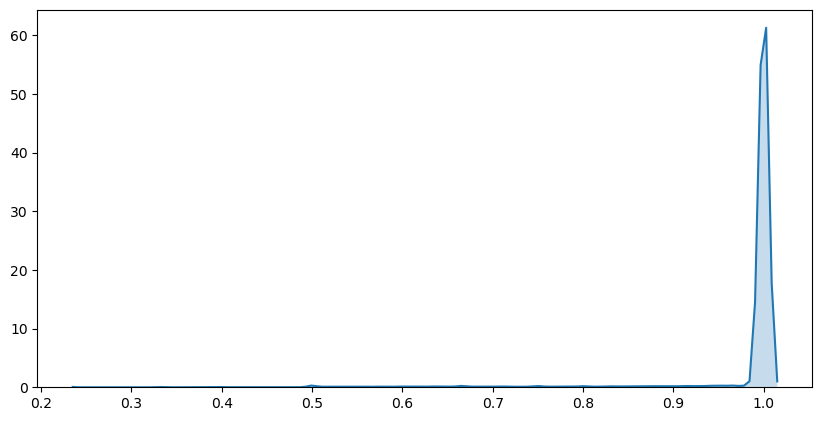

In [117]:
fig, ax = plt.subplots(figsize=(10, 5), dpi=100)

sns.kdeplot(
    selected_copy_ratio_flat[pd.notna(selected_copy_ratio_flat)], 
    bw   =0.005, 
    shade=True, 
    ax   =ax);

1070774: Halonotius sp. J07HN4


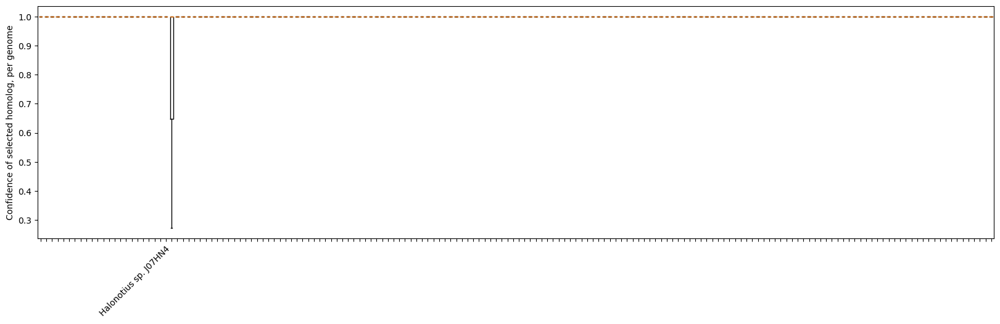

In [173]:
fig, ax = plt.subplots(figsize=(20, 5), dpi=100)

ratios_per_genome = []
xlabels           = []
for index, row in selected_copy_ratio.iterrows():
    ratios_per_genome.append( row[pd.notnull(row)].tolist() )
    
    if np.mean(ratios_per_genome[-1]) < 0.9:
        xlabels.extend( ncbi.translate_to_names([int(index)]) )
        print(f'{index}: {xlabels[-1]}')
    else:
        xlabels.append(None)
ax.set_xticklabels(xlabels, rotation=45, ha='right')
ax.set_ylabel('Confidence of selected homolog, per genome')
ax.boxplot(ratios_per_genome, showfliers=False);

arCOG00086: 0.8313770740843626
arCOG00579: 0.8338261827285717
arCOG01348: 0.8253781502888645
arCOG00770: 0.7963047845400786
arCOG01832: 0.8098684210526316
arCOG01606: 0.7002085877085877


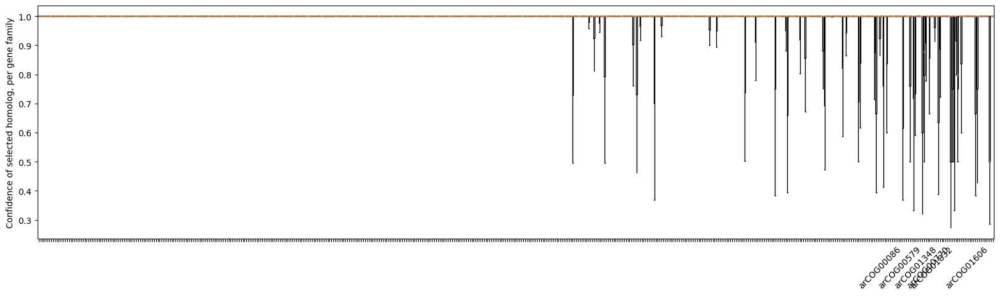

In [174]:
fig, ax = plt.subplots(figsize=(20, 5), dpi=100)

ratios_per_genome = []
xlabels           = []
for index, row in selected_copy_ratio.T.iterrows():
    ratios_per_genome.append( row[pd.notnull(row)].tolist() )
    
    if np.mean(ratios_per_genome[-1]) < 0.85:
        xlabels.append( index )
        print(f'{index}: {np.mean(ratios_per_genome[-1])}')
    else:
        xlabels.append(None)
#     break
ax.set_xticklabels(xlabels, rotation=45, ha='right')
ax.set_ylabel('Confidence of selected homolog, per gene family')
ax.boxplot(ratios_per_genome, showfliers=False);

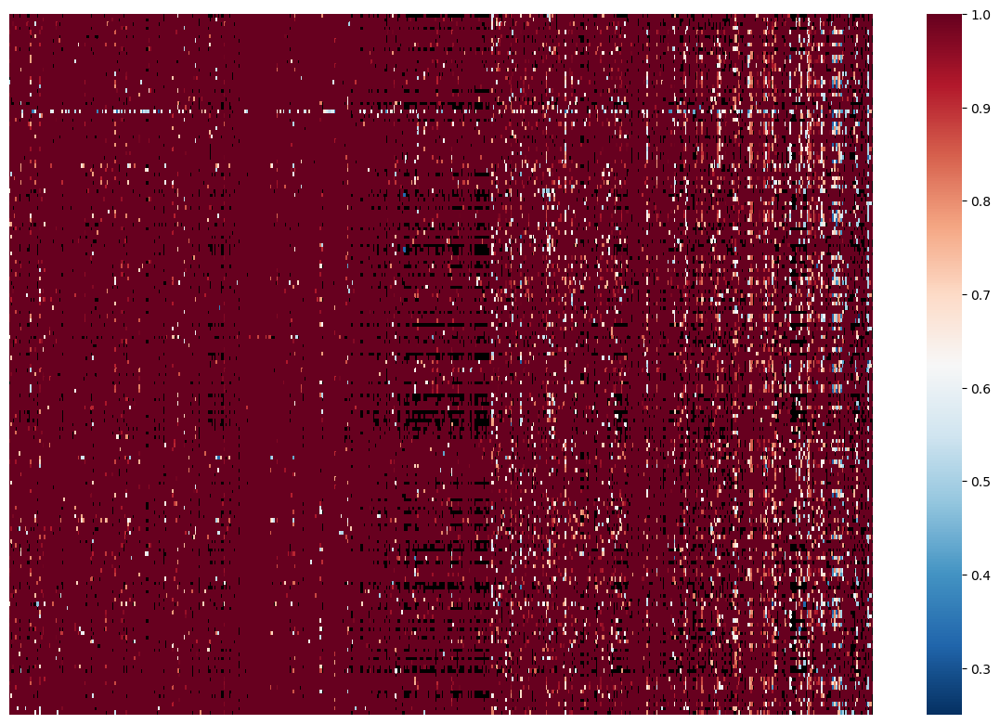

In [114]:
fig, ax = plt.subplots(figsize=(15, 10), dpi=100)
heatmap = sns.heatmap(selected_copy_ratio, cmap='RdBu_r', yticklabels=False, xticklabels=False, ax=ax)
heatmap.set_facecolor('black')

In [177]:
len(clusters[2])

539

In [180]:
single_copy_core = duplicated_genes.query('num_taxa == num_proteins & num_taxa >= 120')

single_copy_core.head()

In [466]:
vertical_cluster_plus_single_copy = set(clusters[2]['name'])
vertical_cluster_plus_single_copy.update(single_copy_core.index.tolist())

subgraph = graph.subgraph(vertical_cluster_plus_single_copy)

random.seed(12345)
subgraph_layout         = subgraph.layout(layout='auto')

subgraph.vs['coords'  ] = subgraph_layout.coords
subgraph.vs['num_taxa'] = duplicated_genes.loc[subgraph.vs['name'], 'num_taxa'].tolist()
subgraph.vs['num_proteins'] = duplicated_genes.loc[subgraph.vs['name'], 'num_proteins'].tolist()

In [428]:
node_color = []
node_shape = []
for node_name in subgraph.vs['name']:
    if node_name in single_copy_core.index:
        node_color.append('rgb(184,63,61,0.7)')
#         node_color.append('rgb(55,110,164,0.7)')
    else:
#         node_color.append('rgb(184,63,61,0.3)')
        node_color.append('rgb(55,110,164,0.3)')
        
    if node_name in clusters[2]['name']:
        node_shape.append('circle')
    else:
        node_shape.append('triangle-up')

In [429]:
ig.plot(subgraph, 
        layout=subgraph_layout,
        vertex_color=node_color, 
        edge_color='rgb(0,0,0,0.3)', 
        vertex_size=0.1 * np.array(subgraph.vs['num_taxa']), 
        vertex_shape=node_shape,
        bbox=(800, 600)
)

In [224]:
vertical_signal_duplication_index = duplicated_genes.loc[clusters[2]['name']].num_proteins / \
                                    duplicated_genes.loc[clusters[2]['name']].num_taxa

In [346]:
tmp = duplicated_genes[duplicated_genes.num_taxa >= 100]
non_vertical_signal_duplication_index = tmp.loc[tmp.index.difference(clusters[2]['name'])].num_proteins / \
                                        tmp.loc[tmp.index.difference(clusters[2]['name'])].num_taxa

In [348]:
vertical_signal_duplication_index.mean(), non_vertical_signal_duplication_index.mean()

(1.1042900254038712, 1.8035273116129493)

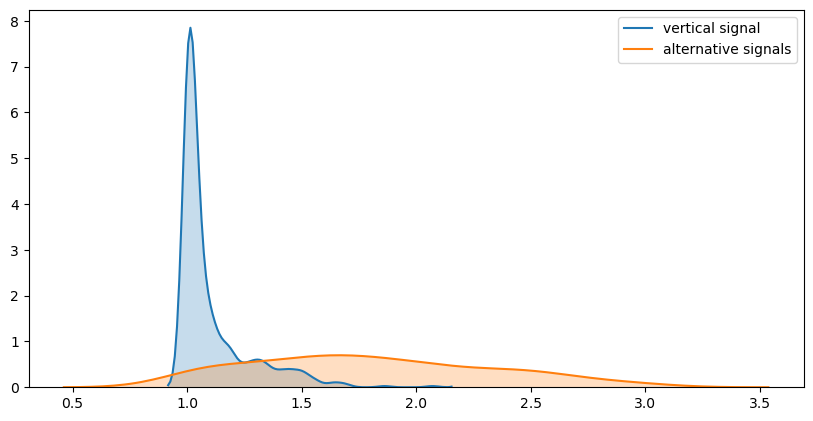

In [394]:
fig, ax = plt.subplots(figsize=(10, 5), dpi=100)
sns.kdeplot(vertical_signal_duplication_index.values,     shade=True, ax=ax, label='vertical signal')
sns.kdeplot(non_vertical_signal_duplication_index.values, shade=True, ax=ax, label='alternative signals');

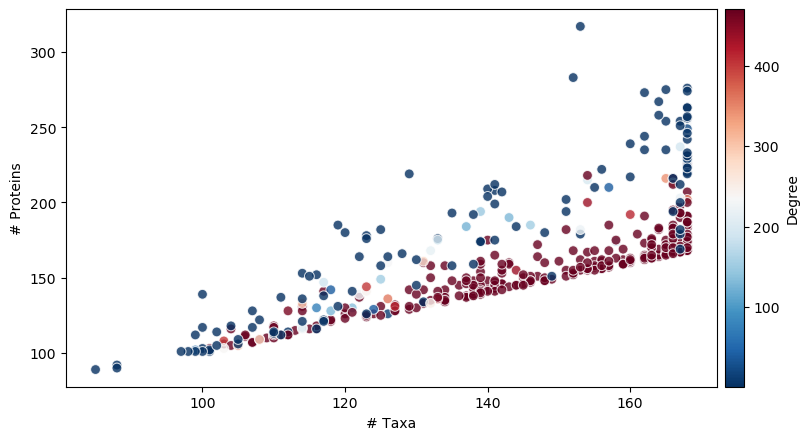

In [469]:
fig, ax = plt.subplots(figsize=(10, 5), dpi=100)

node_degrees = subgraph.degree()
sns.scatterplot(x=subgraph.vs['num_taxa'],
                y=subgraph.vs['num_proteins'],
                hue=node_degrees, 
                palette='RdBu_r',
                hue_norm=(85, 168),
                alpha=0.8,
                s=50,
                ax=ax)

fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=np.min(node_degrees), 
                                                             vmax=np.max(node_degrees), 
                                                             clip=False), 
                                   cmap='RdBu_r'),
             label='Degree',
             pad=0.01)
ax.legend_.remove()
ax.set_xlabel('# Taxa')
ax.set_ylabel('# Proteins');

In [390]:
cles(vertical_signal_duplication_index.values, 
     non_vertical_signal_duplication_index.values)

0.9165471973913533

In [391]:
mannwhitneyu(vertical_signal_duplication_index.values, 
             non_vertical_signal_duplication_index.values)

MannwhitneyuResult(statistic=11692.5, pvalue=4.770581009164814e-83)

In [254]:
# 1070774
taxa_concat = []
for index, row in duplicated_genes.loc[clusters[2]['name']].iterrows():
    taxa_concat.extend([member.split('.')[0] for member in row.members])

taxa_freq = Counter(taxa_concat)

In [490]:
taxa_freq.most_common()

[('1070774', 713),
 ('1114856', 639),
 ('1227499', 637),
 ('1227487', 634),
 ('1227488', 632),
 ('309800', 624),
 ('358396', 619),
 ('1202768', 616),
 ('1227497', 616),
 ('29540', 614),
 ('797114', 612),
 ('1230457', 611),
 ('797304', 610),
 ('1227500', 610),
 ('1293048', 609),
 ('1227495', 609),
 ('797210', 606),
 ('797303', 605),
 ('543526', 605),
 ('1210908', 605),
 ('797209', 604),
 ('1227453', 604),
 ('547559', 600),
 ('1293047', 600),
 ('694430', 598),
 ('662479', 597),
 ('406552', 596),
 ('634497', 595),
 ('797299', 595),
 ('1227457', 595),
 ('1121945', 593),
 ('1448860', 593),
 ('416348', 592),
 ('222984', 591),
 ('795797', 591),
 ('469382', 588),
 ('304371', 587),
 ('926690', 585),
 ('1230460', 584),
 ('1455608', 584),
 ('413816', 584),
 ('485914', 582),
 ('523841', 577),
 ('1041930', 577),
 ('348780', 574),
 ('272569', 573),
 ('751944', 573),
 ('1324957', 572),
 ('1227484', 571),
 ('1071085', 568),
 ('351160', 567),
 ('1333523', 566),
 ('519442', 566),
 ('268739', 566),
 ('59

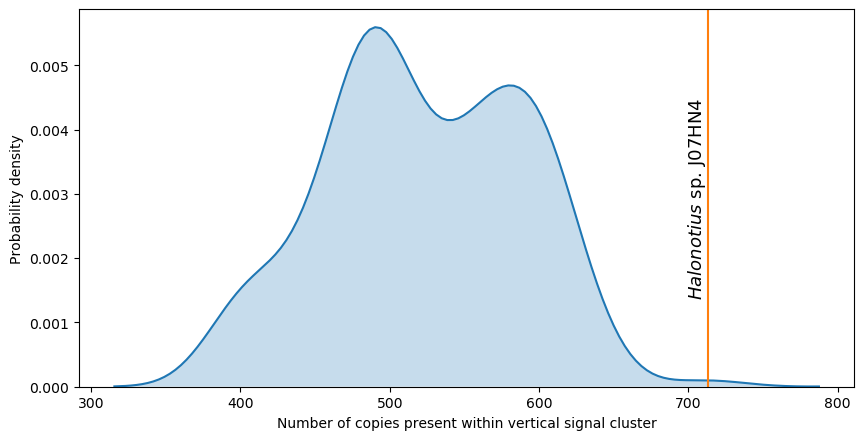

In [331]:
fig, ax = plt.subplots(figsize=(10, 5), dpi=100)

sns.kdeplot(list(Counter(taxa_freq).values()),
            shade=True, ax=ax)
ax.set_ylim(ax.get_ylim())
ax.plot((713, 713),
        ax.get_ylim())

ax.set_xlabel('Number of copies present within vertical signal cluster')
ax.set_ylabel('Probability density')

ax.text(713, 
        ax.get_ylim()[1]/2, 
        "$\it{Halonotius}$ sp. J07HN4", 
        ha="right", 
        va="center", 
        rotation=90,
        size=13);

In [361]:
pwd

'/work/clusterEvo/new_tests/eggNOG/duplications'

In [366]:
eggNOG_annotations = pd.read_csv('../2157_annotations.tsv', 
                                 sep='\t', 
                                 usecols=[1, 2, 3], 
                                 header=None,
                                 names=['group_id', 'category', 'annotation'],
                                 index_col=0)

In [493]:
eggNOG_annotations.loc[clusters[2]['name'], 'category'].value_counts()

J      144
H       75
S       65
F       59
E       36
L       34
K       32
C       26
O       10
G        9
U        9
I        8
D        6
P        5
EH       4
M        2
OU       2
Q        2
N        2
KL       1
DT       1
T        1
A        1
BK       1
CP       1
NOU      1
BQ       1
IM       1
Name: category, dtype: int64

In [494]:
eggNOG_annotations.loc[clusters[0]['name'], 'category'].value_counts()

S      241
L       26
E       20
C       18
O       14
T       11
H       10
I        8
K        8
F        7
M        6
G        6
Q        5
J        3
CP       3
U        3
GM       2
IQ       2
P        2
KLT      2
D        2
CO       1
GK       1
KT       1
EH       1
NU       1
HQ       1
Name: category, dtype: int64

In [368]:
duplicated_genomes                = []
duplicated_only_in_Halonotius     = []
duplicated_only_in_not_Halonotius = []
for index, row in duplicated_genes.loc[clusters[2]['name']].iterrows():
    taxa           = [member.split('.')[0] for member in row.members]
    tmp_duplicated = set()
    
    for tmp in set(taxa):
        if taxa.count(tmp) > 1:
            tmp_duplicated.add(tmp)
    
    if len(tmp_duplicated) == 1:
        duplicated_genomes.extend(tmp_duplicated)
        if '1070774' in tmp_duplicated:
            duplicated_only_in_Halonotius.append(index)
        else:
            duplicated_only_in_not_Halonotius.append(index)

In [376]:
len(duplicated_only_in_not_Halonotius), eggNOG_annotations.loc[duplicated_only_in_not_Halonotius].category.value_counts()

(54,
 J     19
 H      9
 S      7
 F      6
 E      3
 L      2
 K      2
 I      1
 A      1
 D      1
 U      1
 CP     1
 DT     1
 Name: category, dtype: int64)

In [377]:
len(duplicated_only_in_Halonotius), eggNOG_annotations.loc[duplicated_only_in_Halonotius].category.value_counts()

(31,
 J    18
 K     3
 L     2
 S     2
 H     2
 U     1
 I     1
 F     1
 E     1
 Name: category, dtype: int64)

In [389]:
(19+2+2)/54, (18+3+2)/31

(0.42592592592592593, 0.7419354838709677)

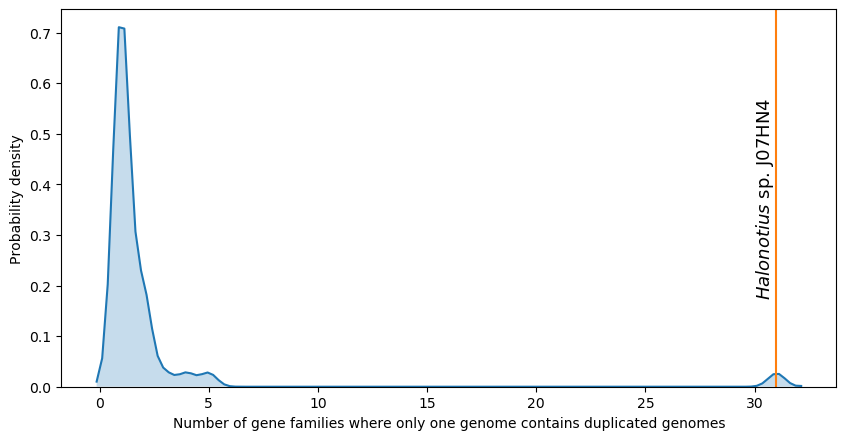

In [329]:
fig, ax = plt.subplots(figsize=(10, 5), dpi=100)

sns.kdeplot(list(Counter(duplicated_genomes).values()),
            shade=True, ax=ax)
ax.set_ylim(ax.get_ylim())
ax.plot((31, 31),
        ax.get_ylim())

ax.set_xlabel('Number of gene families where only one genome contains duplicated genomes')
ax.set_ylabel('Probability density')

ax.text(31, 
        ax.get_ylim()[1]/2, 
        "$\it{Halonotius}$ sp. J07HN4", 
        ha="right", 
        va="center", 
        rotation=90,
        size=13);

In [231]:
duplicated_genes.head()

,num_proteins,num_taxa,members,taxa
group_id,,,,
arCOG00001,153,74,"{273063.STK_07720, 263820.PTO1388, 272844.PAB0...","{224719, 647113, 985053, 591019, 1104324, 2469..."
arCOG00002,188,116,"{195522.BD01_0489, 1210908.HSB1_36360, 751944....","{591019, 572546, 877455, 1343739, 797304, 1227..."
arCOG00006,96,61,"{272569.rrnAC3322, 795797.C497_07079, 29540.C4...","{413816, 1230457, 222984, 358396, 406552, 7957..."
arCOG00014,441,167,"{1151117.AJLF01000002_gene281, 362976.HQ_1455A...","{591019, 572546, 877455, 1343739, 797304, 3398..."
arCOG00016,62,62,"{1151117.AJLF01000001_gene898, 933801.Ahos_087...","{224719, 985053, 330779, 591019, 1104324, 2469..."


In [286]:
distances_between_duplicates = {}

for index, row in eggNOG_trees.loc[clusters[2]['name']].iterrows():
    tmp_tree = ete3.Tree(row.tree)
    
    duplicated_taxa = set()
    observed_taxa   = []
    tree_size       = 0
    for node in tmp_tree.traverse():
        if node.is_leaf():
            node.add_feature('genome', node.name.split('.')[0])
            tree_size += node.dist

            if node.genome not in observed_taxa:
                observed_taxa.append(node.genome)
            else:
                duplicated_taxa.add(node.genome)
        elif not node.is_root():
            tree_size += node.dist
            
    for genome in duplicated_taxa:
        if genome not in distances_between_duplicates:
            distances_between_duplicates[genome] = []
            
        for leaf1, leaf2 in itertools.combinations(tmp_tree.iter_search_nodes(genome=genome), 2):
            distances_between_duplicates[genome].append(tmp_tree.get_distance(leaf1, leaf2) / tree_size)
    
#     break

In [356]:
hell, yeah, medians = [], [], []
for spam, eggs in distances_between_duplicates.items():
    medians.append(np.median(eggs))
    if spam in '1070774':
        hell.extend( ncbi.translate_to_names([int(spam)]) )
#         hell.append(spam)
        print(np.median(eggs))

    else:
        hell.append(None)
    
    yeah.append(eggs)

# concat_yeah = list(itertools.chain(*yeah))

# fig, ax = plt.subplots(figsize=(20, 5), dpi=100)

# ax.set_xticklabels(hell, rotation=45, ha='right')
# ax.boxplot(yeah, showfliers=False);

# ax.fill_between(x=ax.get_xlim(), 
#                 y1=np.percentile(concat_yeah, 75),
#                 y2=np.percentile(concat_yeah, 25), alpha=0.3)

0.009251455746213017


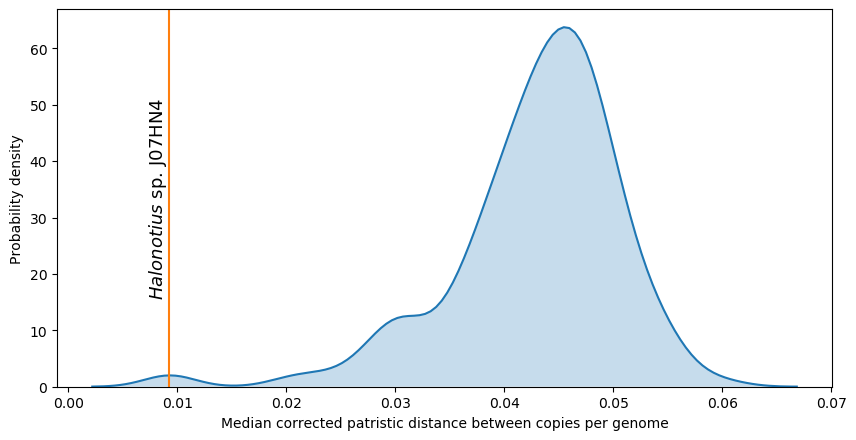

In [325]:
fig, ax = plt.subplots(figsize=(10, 5), dpi=100)

sns.kdeplot(medians, shade=True, ax=ax)
ax.set_ylim(ax.get_ylim())
ax.plot((0.009251455746213017, 0.009251455746213017),
        ax.get_ylim())

ax.set_xlabel('Median corrected patristic distance between copies per genome')
ax.set_ylabel('Probability density')

ax.text(0.009251455746213017, 
        ax.get_ylim()[1]/2, 
        "$\it{Halonotius}$ sp. J07HN4", 
        ha="right", 
        va="center", 
        rotation=90,
        size=13);